<a href="https://colab.research.google.com/github/carlakim/MIR/blob/main/V4_MIR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#How theme songs set the tone to the show genre



* classify based on theme song  
* deduct the genre solley based on the theme song

make a separate file with non showed songs for the training

##imports

In [ ]:
import librosa
from librosa import feature
import numpy as np
import pandas as pd
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt

from librosa import display
import numpy, scipy, matplotlib.pyplot as plt, sklearn, urllib, IPython.display as ipd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Audio for each Genre

Example for each genre

##Action

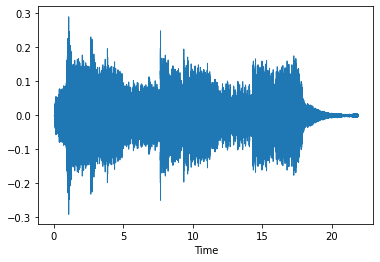

In [ ]:
fileAc= '/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/LOKI.wav'
y, sr = librosa.load(fileAc)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Adventure

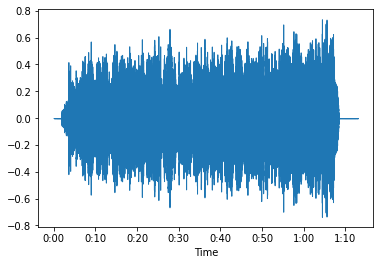

In [ ]:
fileAd= '/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/A_Series_Unfortunate_Events.wav'
y, sr = librosa.load(fileAd)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Comedy

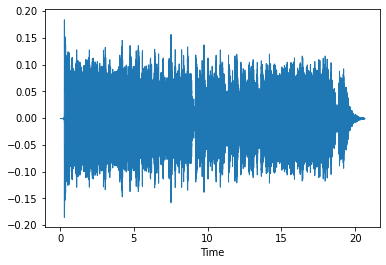

In [ ]:
fileCo= '/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/Brooklyn99.wav'
y, sr = librosa.load(fileCo)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Crime

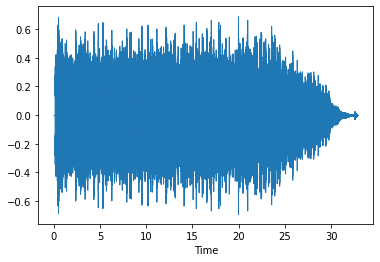

In [ ]:
fileCr= '/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/Sherlock.wav'
y, sr = librosa.load(fileCr)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Drama

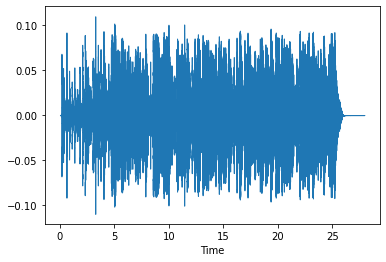

In [ ]:
fileD= '/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/Grey_anatomy.wav'
y, sr = librosa.load(fileD)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##RMS Energy

In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [ ]:
# load audio files with librosa
actionn, sr = librosa.load(fileAc)
adventuree, _ = librosa.load(fileAd)
comedyy, _ = librosa.load(fileCo)
crimee, _ = librosa.load(fileCr)
dramaa, _ = librosa.load(fileD)

In [ ]:
rms_action = librosa.feature.rms(actionn, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_adventure = librosa.feature.rms(adventuree, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_comedy = librosa.feature.rms(comedyy, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_crime = librosa.feature.rms(crimee, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_drama = librosa.feature.rms(dramaa, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
rms_action.shape

(943,)

In [ ]:
rms_adventure.shape

(3148,)

In [ ]:
rms_comedy.shape

(889,)

In [ ]:
rms_crime.shape

(1419,)

In [ ]:
rms_drama.shape

(1204,)

In [ ]:
framesAc = range(len(rms_action))
tac = librosa.frames_to_time(framesAc, hop_length=HOP_LENGTH)

framesAd = range(len(rms_adventure))
tad = librosa.frames_to_time(framesAd, hop_length=HOP_LENGTH)

framesCo = range(len(rms_comedy))
tco = librosa.frames_to_time(framesCo, hop_length=HOP_LENGTH)

framesCr = range(len(rms_crime))
tcr = librosa.frames_to_time(framesCr, hop_length=HOP_LENGTH)

framesD = range(len(rms_drama))
tD = librosa.frames_to_time(framesD, hop_length=HOP_LENGTH)

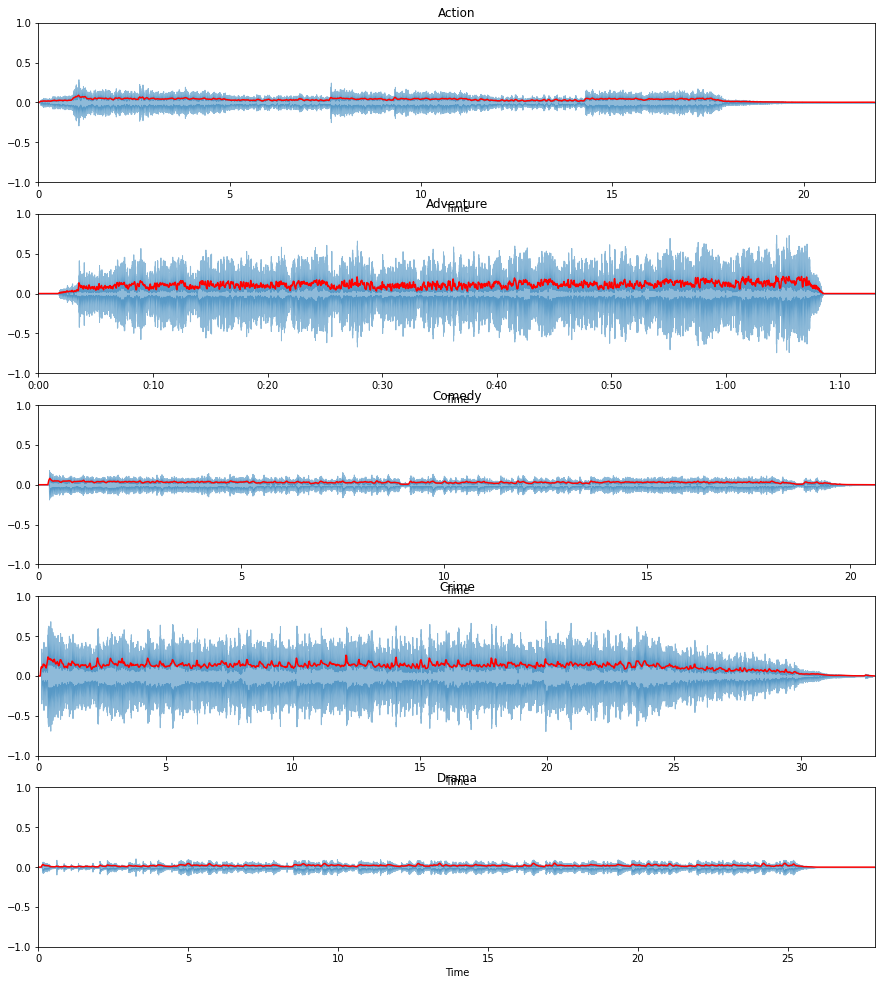

In [ ]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(5, 1, 1)
librosa.display.waveplot(actionn, alpha=0.5)
plt.plot(tac, rms_action, color="r")
plt.ylim((-1, 1))
plt.title("Action")

plt.subplot(5, 1, 2)
librosa.display.waveplot(adventuree, alpha=0.5)
plt.plot(tad, rms_adventure, color="r")
plt.ylim((-1, 1))
plt.title("Adventure")

plt.subplot(5, 1, 3)
librosa.display.waveplot(comedyy, alpha=0.5)
plt.plot(tco, rms_comedy, color="r")
plt.ylim((-1, 1))
plt.title("Comedy")

plt.subplot(5, 1, 4)
librosa.display.waveplot(crimee, alpha=0.5)
plt.plot(tcr, rms_crime, color="r")
plt.ylim((-1, 1))
plt.title("Crime")

plt.subplot(5, 1, 5)
librosa.display.waveplot(dramaa, alpha=0.5)
plt.plot(tD, rms_drama, color="r")
plt.ylim((-1, 1))
plt.title("Drama")

plt.show()

Red is the RMS energy

Root-mean-square of all samples in the frame, the square of the amplitude is the energy, sum the energy for all samples in frame t, and have the mean of it. 

* Indicator of loudness
* Less sensitive to outliers than Amplitude Envelope

#Spectrograms


STFT
@ a small segment of the audio, in a frame

In [ ]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y, 
                             sr=sr, 
                             hop_length=hop_length, 
                             x_axis="time", 
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")

In [ ]:
Frame_size = 2048
hop_size = 512

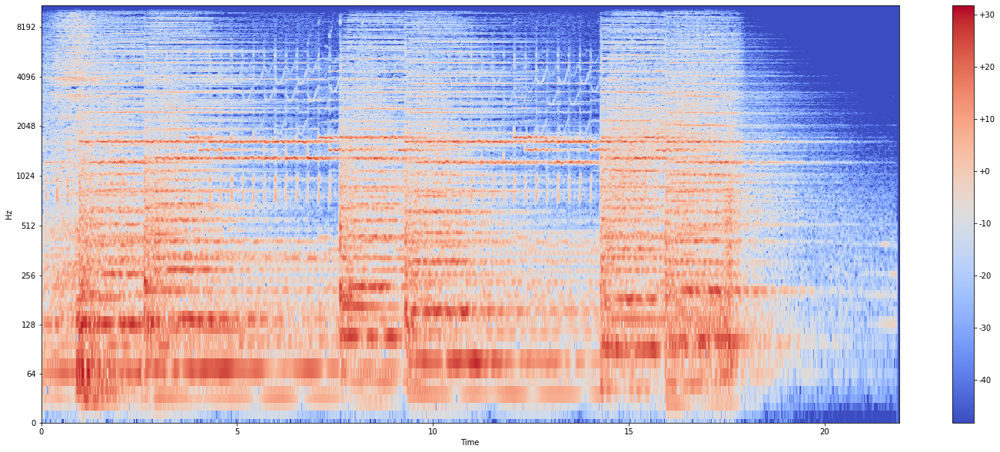

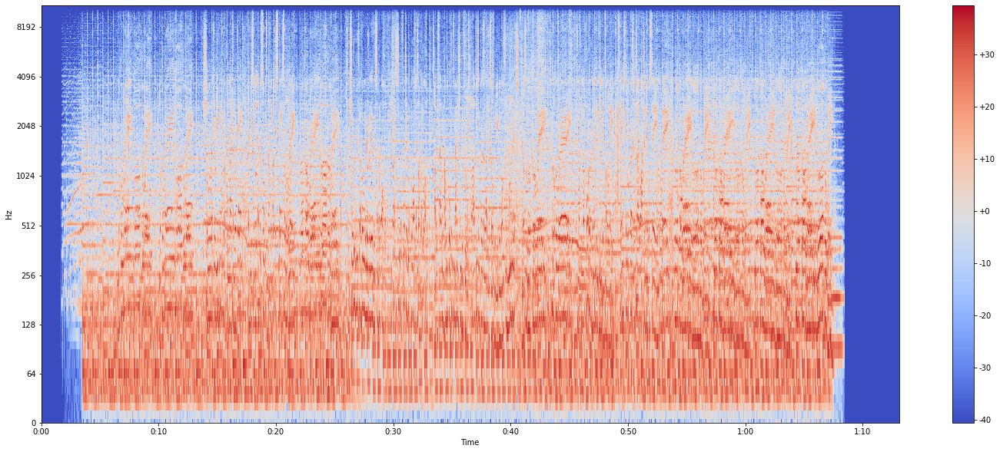

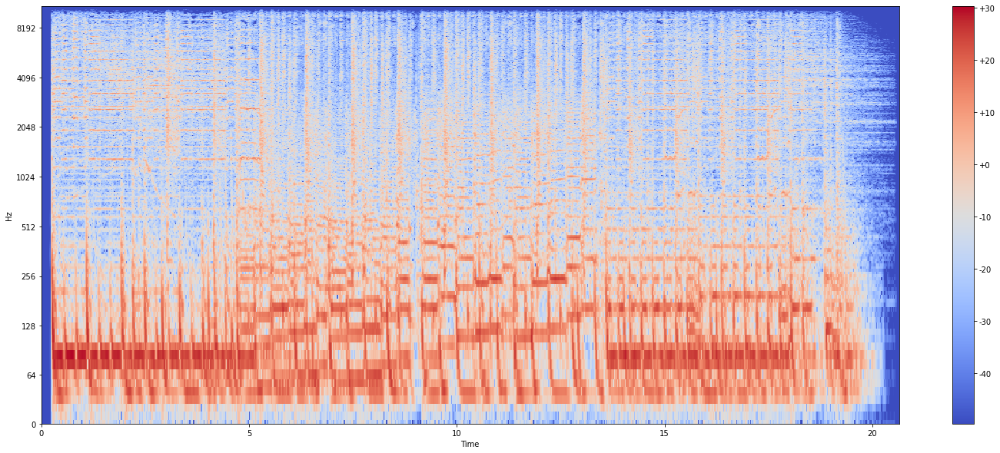

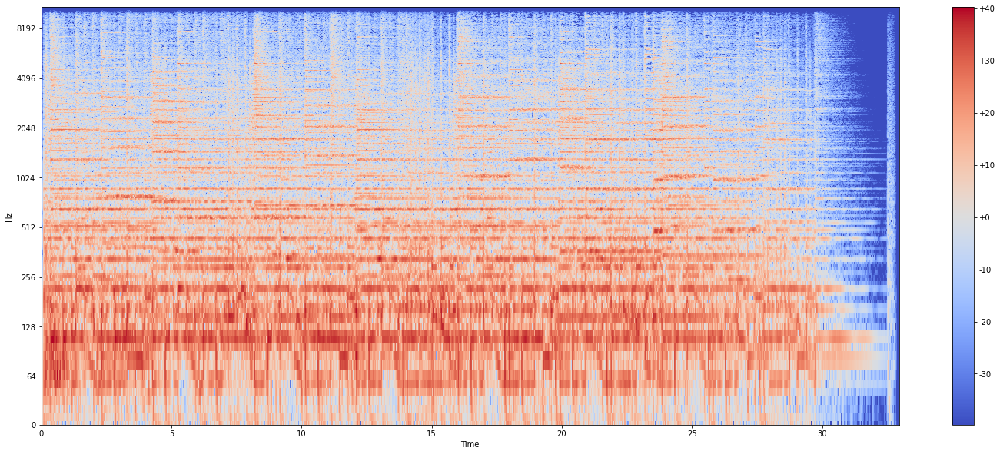

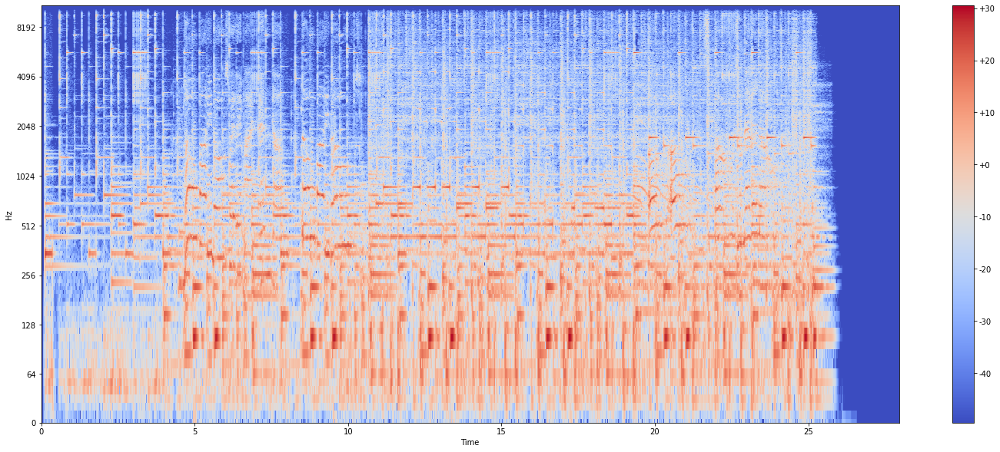

In [ ]:
S_action = librosa.stft(actionn, n_fft=Frame_size, hop_length=hop_size)
S_adventure = librosa.stft(adventuree, n_fft=Frame_size, hop_length=hop_size)
S_comedy = librosa.stft(comedyy, n_fft=Frame_size, hop_length=hop_size)
S_crime = librosa.stft(crimee, n_fft=Frame_size, hop_length=hop_size)
S_drama = librosa.stft(dramaa, n_fft=Frame_size, hop_length=hop_size)

Y_action = librosa.power_to_db(np.abs(S_action) ** 2)
Y_adventure = librosa.power_to_db(np.abs(S_adventure) ** 2)
Y_comedy = librosa.power_to_db(np.abs(S_comedy) ** 2)
Y_crime = librosa.power_to_db(np.abs(S_crime) ** 2)
Y_drama = librosa.power_to_db(np.abs(S_drama) ** 2)

plot_spectrogram(Y_action, sr, hop_size, y_axis="log")
plot_spectrogram(Y_adventure, sr, hop_size, y_axis="log")
plot_spectrogram(Y_comedy, sr, hop_size, y_axis="log")
plot_spectrogram(Y_crime, sr, hop_size, y_axis="log")
plot_spectrogram(Y_drama, sr, hop_size, y_axis="log")

#Feature extraction

make df wiht all features 

In [ ]:
from glob import glob
#directories of normal audios
data_dir = '/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/'
audio_files = glob(data_dir + '*wav')

print(f'Number of audios : {len(audio_files)}')

Number of audios : 109


In [ ]:
audio_files[0]

'/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/Breaking_bad.wav'

In [ ]:
fn_list_i = [
 feature.chroma_stft,
 feature.spectral_centroid,
 feature.spectral_bandwidth,
 feature.spectral_rolloff
]
 
fn_list_ii = [
 feature.rms,
 feature.zero_crossing_rate
]

def get_feature_vector(y,sr): 
   feat_vect_i = [ np.mean(funct(y,sr)) for funct in fn_list_i]
   feat_vect_ii = [ np.mean(funct(y)) for funct in fn_list_ii] 
   feature_vector = feat_vect_i + feat_vect_ii 
   return feature_vector

In [ ]:
#build the matrix with audios featurized
audios_feat = []
for file in audio_files:
  
  y,sr = librosa.load(file,sr=None)   
  feature_vector = get_feature_vector(y, sr) 
  audios_feat.append(feature_vector)  
  print('.', end= " ")

. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

In [ ]:
#make csv file
import csv
norm_output = 'TVSongs.csv'
header =[
 'chroma_stft',
 'spectral_centroid',
 'spectral_bandwidth',
 'spectral_rolloff',
 'rms',
 'zero_crossing_rate'
]

with open(norm_output,'+w') as f:
 csv_writer = csv.writer(f, delimiter = ',')
 csv_writer.writerow(header)
 csv_writer.writerows(audios_feat)

In [ ]:
#make df
dfs = pd.DataFrame (audios_feat, columns = [
 'chroma_stft',
 'spectral_centroid',
 'spectral_bandwidth',
 'spectral_rolloff',
 'rms',
 'zero_crossing_rate'])

dfs.head(5)

,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate
0,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026
1,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557
2,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162
3,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233
4,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944


cleaning names

In [ ]:
dft = pd.DataFrame(audio_files)
dft.columns = ['Song']
dft.head(3)

,Song
0,/content/drive/MyDrive/Colab Notebooks/TODOS S...
1,/content/drive/MyDrive/Colab Notebooks/TODOS S...
2,/content/drive/MyDrive/Colab Notebooks/TODOS S...


In [ ]:
dft['Song'] = dft['Song'].str.replace('/content/drive/MyDrive/Colab Notebooks/TODOS SONGS/', '')
dft['Song'] = dft['Song'].str.replace('.wav', '')
dft.head(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  


,Song
0,Breaking_bad
1,Euphoria
2,Gossip_girl


In [ ]:
#concat both df 
df1 = pd.concat([dft, dfs], axis=1, join='inner')
df1

,Song,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate
0,Breaking_bad,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026
1,Euphoria,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557
2,Gossip_girl,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162
3,Doutlander,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233
4,Grey_anatomy,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944
...,...,...,...,...,...,...,...
104,Chuck,0.585150,2862.283540,3115.791768,5954.202433,0.055615,0.061924
105,GLEE,0.376387,2306.434394,3410.156746,5602.231785,0.033398,0.036435
106,13_Reasons_Why,0.362006,1330.052556,2064.439663,2328.164507,0.032764,0.024416
107,Big_Little_Lies,0.345487,1799.926886,2493.331344,3432.938545,0.046905,0.033200


In [ ]:
#add genre to df 
generos = ['drama','drama','drama', 'drama', 'drama', 'action', 'drama','drama','comedy',
           'comedy','comedy','comedy','comedy','comedy','comedy','comedy','comedy',
           'drama','comedy','comedy','drama','drama','comedy','comedy','drama','crime',
           'action','comedy','comedy','adventure','drama','comedy','comedy','comedy',
           'action','drama','drama','action','action','action','crime','action','drama',
           'comedy','adventure','comedy','adventure','action','crime','drama','adventure',
           'action','comedy','crime','action','comedy','drama','crime','comedy','comedy',
           'action','action','action','drama','comedy','action','action','drama','comedy',
           'action','drama','drama','action','comedy','comedy','action','drama','drama','comedy',
           'crime','action','crime','drama','drama','comedy','action','action','comedy',
           'adventure','drama','crime','crime','action','action','action','action','drama',
           'crime','drama','comedy','drama','action','drama','crime','action','comedy',
           'drama','crime','drama']

In [ ]:
dfg = pd.DataFrame(generos, columns=['genre'])
dfg.head()

,genre
0,drama
1,drama
2,drama
3,drama
4,drama


In [ ]:
len(generos)

109

In [ ]:
#concat
df = pd.concat([df1, dfg], axis=1, join='outer')
df

,Song,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,genre
0,Breaking_bad,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,drama
1,Euphoria,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,drama
2,Gossip_girl,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,drama
3,Doutlander,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,drama
4,Grey_anatomy,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,drama
...,...,...,...,...,...,...,...,...
104,Chuck,0.585150,2862.283540,3115.791768,5954.202433,0.055615,0.061924,action
105,GLEE,0.376387,2306.434394,3410.156746,5602.231785,0.033398,0.036435,comedy
106,13_Reasons_Why,0.362006,1330.052556,2064.439663,2328.164507,0.032764,0.024416,drama
107,Big_Little_Lies,0.345487,1799.926886,2493.331344,3432.938545,0.046905,0.033200,crime


In [ ]:
#MFCC features

#Build Model

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# scale features
from sklearn.preprocessing import StandardScaler
fit = StandardScaler()
X = fit.fit_transform(np.array(df.iloc[:,:-1],dtype=float))

In [ ]:
# dividing into training and test Data
X_train,x_test, Y_train, y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
#Build Model
# KNN classifier
classifier = sklearn.neighbors.KNeighborsClassifier(n_neighbors = 3) #define classifier
classifier.fit(X_train, Y_train) #train

##Train & Test

#Neural Network

In [ ]:
import tensorflow 
import numpy as np

#Keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import mse
from tensorflow.keras.layers import Dense

#CNN

#Music Recommendation by Emotion



*   analyze songs and classify them as different emotions
*   recommend a song based on user input



Feature extration function to extract features from the mp3 files and have them in a df. 

This creates a csv file similar to GTZAN Datase, so I can use for the next steps.

In [ ]:
def extract_feature(path):
    id = 1  # Song ID
    feature_set = pd.DataFrame()  # Feature Matrix
    
    # Individual Feature Vectors
    songname_vector = pd.Series()
    tempo_vector = pd.Series()
    total_beats = pd.Series()
    average_beats = pd.Series()
    chroma_stft_mean = pd.Series()
    chroma_stft_std = pd.Series()
    chroma_stft_var = pd.Series()
    chroma_cq_mean = pd.Series()
    chroma_cq_std = pd.Series()
    chroma_cq_var = pd.Series()
    chroma_cens_mean = pd.Series()
    chroma_cens_std = pd.Series()
    chroma_cens_var = pd.Series()
    mel_mean = pd.Series()
    mel_std = pd.Series()
    mel_var = pd.Series()
    mfcc_mean = pd.Series()
    mfcc_std = pd.Series()
    mfcc_var = pd.Series()
    mfcc_delta_mean = pd.Series()
    mfcc_delta_std = pd.Series()
    mfcc_delta_var = pd.Series()
    rms_mean = pd.Series()
    rms_std = pd.Series()
    rms_var = pd.Series()
    cent_mean = pd.Series()
    cent_std = pd.Series()
    cent_var = pd.Series()
    spec_bw_mean = pd.Series()
    spec_bw_std = pd.Series()
    spec_bw_var = pd.Series()
    contrast_mean = pd.Series()
    contrast_std = pd.Series()
    contrast_var = pd.Series()
    rolloff_mean = pd.Series()
    rolloff_std = pd.Series()
    rolloff_var = pd.Series()
    poly_mean = pd.Series()
    poly_std = pd.Series()
    poly_var = pd.Series()
    tonnetz_mean = pd.Series()
    tonnetz_std = pd.Series()
    tonnetz_var = pd.Series()
    zcr_mean = pd.Series()
    zcr_std = pd.Series()
    zcr_var = pd.Series()
    harm_mean = pd.Series()
    harm_std = pd.Series()
    harm_var = pd.Series()
    perc_mean = pd.Series()
    perc_std = pd.Series()
    perc_var = pd.Series()
    frame_mean = pd.Series()
    frame_std = pd.Series()
    frame_var = pd.Series()
    
    
    # Traversing over each file in path
    file_data = [f for f in listdir(path) if isfile(join(path, f))] 
    for line in file_data:
        if ( line[-1:] == '\n' ):
            line = line[:-1]

        # Reading Song
        songname = path + line
        y, sr = librosa.load(songname, duration=10)
        S = np.abs(librosa.stft(y))
        
        # Extracting Features
        tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        chroma_cq = librosa.feature.chroma_cqt(y=y, sr=sr)
        chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)
        melspectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
        rms = librosa.feature.rms(y=y)
        cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        contrast = librosa.feature.spectral_contrast(S=S, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        poly_features = librosa.feature.poly_features(S=S, sr=sr)
        tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        harmonic = librosa.effects.harmonic(y)
        percussive = librosa.effects.percussive(y)
        
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        mfcc_delta = librosa.feature.delta(mfcc)
    
        onset_frames = librosa.onset.onset_detect(y=y, sr=sr)
        frames_to_time = librosa.frames_to_time(onset_frames[:20], sr=sr)
        
        # Transforming Features
        songname_vector.at[id, line]  # song name
        tempo_vector.at[id, tempo]  # tempo
        total_beats.at[id, sum(beats)]  # beats
        average_beats.at[id, np.average(beats)]
        chroma_stft_mean.at[id, np.mean(chroma_stft)]  # chroma stft
        chroma_stft_std.at[id, np.std(chroma_stft)]
        chroma_stft_var.at[id, np.var(chroma_stft)]
        chroma_cq_mean.at[id, np.mean(chroma_cq)]  # chroma cq
        chroma_cq_std.at[id, np.std(chroma_cq)]
        chroma_cq_var.at[id, np.var(chroma_cq)]
        chroma_cens_mean.at[id, np.mean(chroma_cens)]  # chroma cens
        chroma_cens_std.at[id, np.std(chroma_cens)]
        chroma_cens_var.at[id, np.var(chroma_cens)]
        mel_mean.at[id, np.mean(melspectrogram)] # melspectrogram
        mel_std.at[id, np.std(melspectrogram)]
        mel_var.at[id, np.var(melspectrogram)]
        mfcc_mean.at[id, np.mean(mfcc)]  # mfcc
        mfcc_std.at[id, np.std(mfcc)]
        mfcc_var.at[id, np.var(mfcc)]
        mfcc_delta_mean.at[id, np.mean(mfcc_delta)]  # mfcc delta
        mfcc_delta_std.at[id, np.std(mfcc_delta)]
        mfcc_delta_var.at[id, np.var(mfcc_delta)]
        rms_mean.at[id, np.mean(rms)]  # rmse
        rms_std.at[id, np.std(rms)]
        rms_var.at[id, np.var(rms)]
        cent_mean.at[id, np.mean(cent)]  # cent
        cent_std.at[id, np.std(cent)]
        cent_var.at[id, np.var(cent)]
        spec_bw_mean.at[id, np.mean(spec_bw)]  # spectral bandwidth
        spec_bw_std.at[id, np.std(spec_bw)]
        spec_bw_var.at[id, np.var(spec_bw)]
        contrast_mean.at[id, np.mean(contrast)]  # contrast
        contrast_std.at[id, np.std(contrast)]
        contrast_var.at[id, np.var(contrast)]
        rolloff_mean.at[id, np.mean(rolloff)]  # rolloff
        rolloff_std.at[id, np.std(rolloff)]
        rolloff_var.at[id, np.var(rolloff)]
        poly_mean.at[id, np.mean(poly_features)]  # poly features
        poly_std.at[id, np.std(poly_features)]
        poly_var.at[id, np.var(poly_features)]
        tonnetz_mean.at[id, np.mean(tonnetz)]  # tonnetz
        tonnetz_std.at[id, np.std(tonnetz)]
        tonnetz_var.at[id, np.var(tonnetz)]
        zcr_mean.at[id, np.mean(zcr)]  # zero crossing rate
        zcr_std.at[id, np.std(zcr)]
        zcr_var.at[id, np.var(zcr)]
        harm_mean.at[id, np.mean(harmonic)]  # harmonic
        harm_std.at[id, np.std(harmonic)]
        harm_var.at[id, np.var(harmonic)]
        perc_mean.at[id, np.mean(percussive)]  # percussive
        perc_std.at[id, np.std(percussive)]
        perc_var.at[id, np.var(percussive)]
        frame_mean.at[id, np.mean(frames_to_time)]  # frames
        frame_std.at[id, np.std(frames_to_time)]
        frame_var.at[id, np.var(frames_to_time)]
        
        print(songname)
        id = id+1
    
    # Concatenating Features into one csv and json format
    feature_set['song_name'] = songname_vector  # song name
    feature_set['tempo'] = tempo_vector  # tempo 
    feature_set['total_beats'] = total_beats  # beats
    feature_set['average_beats'] = average_beats
    feature_set['chroma_stft_mean'] = chroma_stft_mean  # chroma stft
    feature_set['chroma_stft_std'] = chroma_stft_std
    feature_set['chroma_stft_var'] = chroma_stft_var
    feature_set['chroma_cq_mean'] = chroma_cq_mean  # chroma cq
    feature_set['chroma_cq_std'] = chroma_cq_std
    feature_set['chroma_cq_var'] = chroma_cq_var
    feature_set['chroma_cens_mean'] = chroma_cens_mean  # chroma cens
    feature_set['chroma_cens_std'] = chroma_cens_std
    feature_set['chroma_cens_var'] = chroma_cens_var
    feature_set['melspectrogram_mean'] = mel_mean  # melspectrogram
    feature_set['melspectrogram_std'] = mel_std
    feature_set['melspectrogram_var'] = mel_var
    feature_set['mfcc_mean'] = mfcc_mean  # mfcc
    feature_set['mfcc_std'] = mfcc_std
    feature_set['mfcc_var'] = mfcc_var
    feature_set['mfcc_delta_mean'] = mfcc_delta_mean  # mfcc delta
    feature_set['mfcc_delta_std'] = mfcc_delta_std
    feature_set['mfcc_delta_var'] = mfcc_delta_var
    feature_set['rms_mean'] = rms_mean  # rmse
    feature_set['rms_std'] = rms_std
    feature_set['rms_var'] = rms_var
    feature_set['cent_mean'] = cent_mean  # cent
    feature_set['cent_std'] = cent_std
    feature_set['cent_var'] = cent_var
    feature_set['spec_bw_mean'] = spec_bw_mean  # spectral bandwidth
    feature_set['spec_bw_std'] = spec_bw_std
    feature_set['spec_bw_var'] = spec_bw_var
    feature_set['contrast_mean'] = contrast_mean  # contrast
    feature_set['contrast_std'] = contrast_std
    feature_set['contrast_var'] = contrast_var
    feature_set['rolloff_mean'] = rolloff_mean  # rolloff
    feature_set['rolloff_std'] = rolloff_std
    feature_set['rolloff_var'] = rolloff_var
    feature_set['poly_mean'] = poly_mean  # poly features
    feature_set['poly_std'] = poly_std
    feature_set['poly_var'] = poly_var
    feature_set['tonnetz_mean'] = tonnetz_mean  # tonnetz
    feature_set['tonnetz_std'] = tonnetz_std
    feature_set['tonnetz_var'] = tonnetz_var
    feature_set['zcr_mean'] = zcr_mean  # zero crossing rate
    feature_set['zcr_std'] = zcr_std
    feature_set['zcr_var'] = zcr_var
    feature_set['harm_mean'] = harm_mean  # harmonic
    feature_set['harm_std'] = harm_std
    feature_set['harm_var'] = harm_var
    feature_set['perc_mean'] = perc_mean  # percussive
    feature_set['perc_std'] = perc_std
    feature_set['perc_var'] = perc_var
    feature_set['frame_mean'] = frame_mean  # frames
    feature_set['frame_std'] = frame_std
    feature_set['frame_var'] = frame_var

    # Converting Dataframe into CSV Excel and JSON file
    feature_set.to_csv('Emotion_features.csv')
    feature_set.to_json('Emotion_features.json')

In [ ]:
#your folder path
myfpath="/content/drive/MyDrive/Colab Notebooks/emotifymusic/classical"

#read files
f_filenames = [f for f in listdir(myfpath) if isfile(join(myfpath, f))] 

#print your filenames
print(f_filenames)

['8.mp3', '7.mp3', '9.mp3', '10.mp3', '6.mp3', '4.mp3', '11.mp3', '5.mp3', '16.mp3', '15.mp3', '13.mp3', '19.mp3', '20.mp3', '17.mp3', '12.mp3', '18.mp3', '14.mp3', '28.mp3', '29.mp3', '25.mp3', '27.mp3', '26.mp3', '24.mp3', '30.mp3', '23.mp3', '31.mp3', '21.mp3', '22.mp3', '36.mp3', '34.mp3', '38.mp3', '33.mp3', '32.mp3', '37.mp3', '43.mp3', '41.mp3', '35.mp3', '39.mp3', '42.mp3', '45.mp3', '52.mp3', '44.mp3', '51.mp3', '49.mp3', '47.mp3', '53.mp3', '48.mp3', '50.mp3', '46.mp3', '63.mp3', '62.mp3', '54.mp3', '58.mp3', '65.mp3', '61.mp3', '60.mp3', '55.mp3', '56.mp3', '59.mp3', '64.mp3', '75.mp3', '72.mp3', '68.mp3', '70.mp3', '66.mp3', '73.mp3', '76.mp3', '69.mp3', '74.mp3', '71.mp3', '67.mp3', '78.mp3', '86.mp3', '80.mp3', '81.mp3', '83.mp3', '85.mp3', '79.mp3', '77.mp3', '84.mp3', '82.mp3', '91.mp3', '87.mp3', '93.mp3', '89.mp3', '88.mp3', '92.mp3', '90.mp3', '95.mp3', '94.mp3', '40.mp3', '100.mp3', '3.mp3', '98.mp3', '1.mp3', '96.mp3', '99.mp3', '97.mp3', '57.mp3', '2.mp3']


In [ ]:
# Extracting Feature Function Call
extract_feature('/content/drive/MyDrive/Colab Notebooks/emotifymusic/classical/')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-pa

KeyError: ignored